# Step 5A: Hyperparameter tuning for each stock

## 1. Required Imports

### 1.1 Import required libraries

In [1]:
import pandas as pd
from datetime import datetime
import re
import numpy as np
import math
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split
from sklearn.model_selection import GridSearchCV
import os
import ast

from scipy import stats
from sklearn import preprocessing
import tensorflow as tf
from keras.utils import np_utils
from keras import backend as bck
from sklearn.metrics import r2_score
from keras.wrappers.scikit_learn import KerasRegressor

import seaborn as sns
import matplotlib.pyplot as plt

### 1.2 Prepare data to be used in the CNN-LSTM model

- *Import stock's technical data and sentiment data from BERT Model 1*
- *Join both the data and form a single dataframe containing all required columns for BERT*


In [2]:
tick_list =  ['AAPL', 'AMC', 'DKNG', 'TSLA', 'AMD', 'BABA']

In [3]:
reddit_data = {}
twitter_data = {}
reddit_date_df = {}
twitter_date_df = {}

In [4]:
for tick in tick_list:
    stock_df = pd.read_pickle(f"C:\\Users\\Karthik\\Desktop\\Dissertation\\Final_dfs\\{tick}_technical_data_df.pkl")
    reddit_sentiment_data = pd.read_pickle(f"C:\\Users\\Karthik\\Desktop\\Dissertation\\Final_dfs\\reddit_{tick}_BERT_TwitterAirline_Even.pkl")
    twitter_sentiment_data = pd.read_pickle(f"C:\\Users\\Karthik\\Desktop\\Dissertation\\Final_dfs\\twitter_{tick}_BERT_TwitterAirline_Even.pkl")
    
    ymd_reddit = pd.DataFrame(list(reddit_sentiment_data['YearMonDay'].unique()), columns=['YearMonDay'])
    ymd_twitter = pd.DataFrame(list(twitter_sentiment_data['YearMonDay'].unique()), columns=['YearMonDay'])
    temp_ymd = pd.merge(pd.merge(ymd_reddit, ymd_twitter, how="inner", on="YearMonDay"), pd.DataFrame(stock_df.YearMonDay.unique(), columns=['YearMonDay']), on='YearMonDay')
    stock_df = pd.merge(stock_df, temp_ymd, how="inner", on="YearMonDay")
    
    temp_reddit_data = pd.merge(stock_df, reddit_sentiment_data, how="inner", on="YearMonDay")
    temp_twitter_data = pd.merge(stock_df, twitter_sentiment_data, how="inner", on="YearMonDay")
    
    #--Get the dates which will be used later for visualizations
    reddit_date_df[f'{tick}'] = temp_reddit_data['Date'].iloc[5:].apply(lambda x: datetime.strftime(x, '%d-%m-%Y')).reset_index(drop=True)
    twitter_date_df[f'{tick}'] = temp_twitter_data['Date'].iloc[5:].apply(lambda x: datetime.strftime(x, '%d-%m-%Y')).reset_index(drop=True)
    
    reddit_data[f'{tick}'] = temp_reddit_data[['ACD','MACD','CHO','Highest_T','Lowest_T','S-K','S-D','VPT','W-R','RSI','MOME','AC','PROC','VROC','OBV','positive','neutral','negative','log_ret-t','Close']]
    twitter_data[f'{tick}'] = temp_twitter_data[['ACD','MACD','CHO','Highest_T','Lowest_T','S-K','S-D','VPT','W-R','RSI','MOME','AC','PROC','VROC','OBV','positive','neutral','negative','log_ret-t','Close']]    

In [5]:
print(list(reddit_data.keys())[0])
list(reddit_data.values())[0]

AAPL


,ACD,MACD,CHO,Highest_T,Lowest_T,S-K,S-D,VPT,W-R,RSI,MOME,AC,PROC,VROC,OBV,positive,neutral,negative,log_ret-t,Close
0,7.900169e+07,3.728473,-2.061350e+07,109.162300,91.857498,100.000000,100.000000,1.597211e+06,0.000000,73.284602,13.622665,5.198841,13.466490,17.734731,2125700800,0.648186,0.155055,0.196759,0.006656,109.162300
1,2.257037e+08,4.316435,3.156445e+07,112.970901,91.857498,100.000000,100.000000,7.504010e+06,0.000000,76.856681,15.417870,7.482996,17.096306,127.444001,2328129600,0.577385,0.127737,0.294878,0.003618,112.970901
2,-7.496904e+06,4.761370,-3.836517e+07,112.970901,91.857498,77.067797,74.969873,-1.415481e+06,4.564902,73.748827,15.530182,7.252765,21.935713,14.541078,2342487600,0.469248,0.206299,0.324453,-0.022998,112.007095
3,-6.358957e+07,4.635848,-6.675786e+07,112.970901,91.857498,0.000000,41.636540,-2.500967e+06,20.342014,66.790874,16.590385,6.458214,15.570294,55.017077,2154585200,0.524859,0.043184,0.431957,0.014430,108.676010
4,-2.199483e+07,4.747793,-5.906946e+07,112.970901,91.857498,84.094753,53.720850,-8.466314e+04,3.235448,78.416084,20.430290,5.745921,21.405592,59.804141,2320183200,0.630671,0.139479,0.229851,-0.030191,112.287788
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
202,7.404873e+07,3.438425,2.033657e+07,148.926865,142.236893,100.000000,100.000000,1.066254e+06,2.387817,63.533997,4.413391,-1.956946,2.673841,-27.486715,2812898400,0.690731,0.093265,0.216004,0.011918,148.767120
203,-1.963617e+07,3.239763,-5.133396e+06,148.926865,142.236893,38.161440,79.387147,-1.352177e+06,35.522336,54.327286,3.524719,-2.032053,1.570933,37.377473,2708079800,0.600917,0.069532,0.329551,0.002890,146.550430
204,-2.285859e+07,2.913251,-1.611157e+07,148.926865,142.236893,0.000000,46.053813,-3.012319e+06,62.238786,53.361669,-0.129807,-2.541269,-0.453172,17.955589,2589148600,0.753993,0.181128,0.064878,-0.015013,144.763107
205,1.639799e+07,2.671884,-6.647225e+06,148.926865,142.236893,16.458783,18.206741,-1.192364e+06,52.388045,51.074176,1.138290,-3.108466,-2.353333,-55.372575,2645848100,0.481356,0.127223,0.391421,-0.012271,145.422119


In [6]:
scaler = MinMaxScaler(feature_range = (-1, 1))

for tick, tick_df in reddit_data.items():
#     tick_df = tick_df.iloc[2:]
    tick_df = tick_df[['ACD','MACD','CHO','Highest_T','Lowest_T','S-K','S-D','VPT','W-R','RSI','MOME','AC','PROC','VROC','OBV','positive','neutral','negative','log_ret-t','Close']]
    tick_df.iloc[:] = scaler.fit_transform(tick_df.iloc[:].values)
    reddit_data[tick] = tick_df


In [7]:
print(list(reddit_data.keys())[0])
list(reddit_data.values())[0]

AAPL


,ACD,MACD,CHO,Highest_T,Lowest_T,S-K,S-D,VPT,W-R,RSI,MOME,AC,PROC,VROC,OBV,positive,neutral,negative,log_ret-t,Close
0,0.390259,0.418604,-0.227948,-1.000000,-1.0,1.000000,1.000000,0.138272,-1.000000,0.642699,0.679554,0.772467,0.583071,-0.254433,-0.676404,0.330157,-0.439174,-0.615447,0.242532,-0.859475
1,0.950847,0.540362,0.253534,-0.808442,-1.0,1.000000,1.000000,0.393271,-1.000000,0.726400,0.764057,1.000000,0.761762,0.698950,-0.406227,0.180056,-0.540235,-0.411978,0.200639,-0.681377
2,0.059724,0.632502,-0.391755,-0.808442,-1.0,0.541356,0.499397,0.008213,-0.908702,0.653576,0.769344,0.977066,1.000000,-0.282186,-0.387064,-0.049199,-0.249597,-0.350648,-0.166401,-0.726447
3,-0.154622,0.606508,-0.653754,-0.808442,-1.0,-1.000000,-0.167269,-0.038647,-0.593160,0.490537,0.819249,0.897918,0.686639,0.069554,-0.637853,0.068700,-0.853040,-0.127717,0.349737,-0.882215
4,0.004323,0.629690,-0.582807,-0.808442,-1.0,0.681895,0.074417,0.065665,-0.935291,0.762940,1.000000,0.826964,0.973903,0.111154,-0.416833,0.293024,-0.496798,-0.546825,-0.265592,-0.713321
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
202,0.371332,0.358540,0.149926,1.000000,1.0,1.000000,1.000000,0.115351,-0.952244,0.414221,0.246058,0.059653,0.051764,-0.647411,0.240783,0.420356,-0.667766,-0.575539,0.315092,0.992530
203,0.013336,0.317400,-0.085102,1.000000,1.0,-0.236771,0.587743,0.010946,-0.289553,0.198488,0.204227,0.052171,-0.002531,-0.083736,0.100884,0.229946,-0.755566,-0.340076,0.190603,0.888873
204,0.001023,0.249784,-0.186406,1.000000,1.0,-1.000000,-0.078924,-0.060723,0.244776,0.175861,0.032202,0.001446,-0.102175,-0.252514,-0.057851,0.554473,-0.342715,-0.888929,-0.056278,0.805294
205,0.151033,0.199801,-0.099072,1.000000,1.0,-0.670824,-0.635865,0.017846,0.047761,0.122261,0.091894,-0.055055,-0.195717,-0.889742,0.017825,-0.023530,-0.542137,-0.211777,-0.018472,0.836111


### 2. Prepare training, validation and testing datasets

### 2.1 Define a windowing function
*The inputs to CNN networks are fed in the form of windows (analgous to matrices)*
*This function also splits data into train, validation and test datasets*

In [8]:
TRAIN_TESTVAL_SPLIT = 0.28 #what % of data to assign for test and validation datasets
TEST_VAL_SPLIT = 0.5 #what percentage of test data to assign for validation dataset

N_TIME_STEPS = 5 #sliding window length
STEP = 1 #Since we have very little data, we set the sliding window step size as 1
N_FEATURES = 19

# def data_split_and_sliding_window(x, y, n_time_steps, step):

def data_split_and_sliding_window(x, train_testval_split, test_val_split, n_time_steps, step):
    
    def sliding_window_fnc(x, n_time_steps, step):
        input_window = []
        output_window = []
        len_x = x.shape[0]
        for i in range(0, len_x-n_time_steps, step):
            input_window.append(x.iloc[i:i+n_time_steps, 0:-1].values)
    #             temp_activity = stats.mode(y[i:i+n_time_steps])[0][0]
            output_window.append(x.iloc[i+n_time_steps, -1])
        return np.array(input_window), np.array(output_window)
    
    #--Split dataset into trianing, testing and validation sets
    org_dataset_shape = x.shape[0]
    training_rows = round(x.shape[0] * (1 - (train_testval_split)))
    testing_rows = round((x.shape[0] - training_rows) * (1 - (test_val_split)))
    val_rows = round(x.shape[0] - (training_rows+testing_rows))
#     print(training_rows, testing_rows, val_rows)
        
    training_dataset = x.iloc[0:training_rows, :]
    testing_dataset = x.iloc[training_rows:(x.shape[0]-val_rows)]
    val_dataset = x.iloc[(training_rows + testing_rows) : x.shape[0]]
#     print(org_dataset_shape, training_dataset.shape, testing_dataset.shape, val_dataset.shape)
    
    train_x, train_y = sliding_window_fnc(training_dataset, N_TIME_STEPS, STEP)
    val_x, val_y = sliding_window_fnc(testing_dataset, N_TIME_STEPS, STEP)
    test_x, test_y = sliding_window_fnc(val_dataset, N_TIME_STEPS, STEP)  
    
    return train_x, train_y, test_x, test_y, val_x, val_y
# data_split_and_sliding_window(reddit_data, TRAIN_TESTVAL_SPLIT, TEST_VAL_SPLIT)

### 2.2 Define a function to convert datasets into tensors
*Best practise when using tensorflow/ keras models is to input the data in the form of tensors*

In [9]:
def tf_dataset(series_x, series_y, batch_size, shuffle_buffer, shuffle=True):
    ds = tf.data.Dataset.from_tensor_slices((series_x, series_y))
    if shuffle:
        ds = ds.cache().shuffle(shuffle_buffer).batch(batch_size).repeat()
    else:
        ds = ds.cache().batch(batch_size).repeat()

    return ds

## 3. Model definition

### 3.1 Define a simple CNN-LSTM model and check if predictions are output as expected

*use data for a single ticker*

In [11]:
reddit_data_AAPL = reddit_data['TSLA']
reddit_data_AAPL

,ACD,MACD,CHO,Highest_T,Lowest_T,S-K,S-D,VPT,W-R,RSI,MOME,AC,PROC,VROC,OBV,positive,neutral,negative,log_ret-t,Close
0,-0.509871,0.053372,-0.199907,-0.928091,-0.968220,0.912923,0.715232,0.065726,0.398053,-0.034670,-0.051384,-0.208038,-0.484557,-0.957782,-0.905646,0.602007,-0.231975,-0.902509,0.144002,-0.926873
1,-0.518632,0.037640,-0.197153,-0.928091,-0.968220,1.000000,0.852857,0.067496,0.357700,-0.027033,-0.187696,-0.192553,-0.519448,-0.911568,-0.875970,0.074375,-0.302797,-0.332197,0.131121,-0.923859
2,-0.508394,-0.019088,-0.226004,-0.963329,-0.968220,-1.000000,-0.333333,-0.034890,0.982091,-0.326185,-0.207846,-0.191343,-0.318382,-0.925649,-0.957282,-0.058717,-0.400683,-0.155929,0.016987,-0.970797
3,-0.635810,-0.057943,-0.362591,-1.000000,-1.000000,-1.000000,-1.000000,-0.047022,1.000000,-0.456216,-0.173094,-0.211852,-0.650496,-0.866010,-1.000000,-0.089135,0.047459,-0.306207,0.023152,-1.000000
4,-0.264979,-0.038961,-0.025119,-0.989457,-1.000000,1.000000,-0.333333,0.714766,-1.000000,0.066217,0.100758,-0.183089,-0.159386,-0.529930,-0.891892,0.070809,-0.088920,-0.415159,-0.014640,-0.880775
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
202,-0.460077,-0.132530,-0.351050,0.313629,0.374208,0.663551,-0.239094,0.086002,0.327033,-0.025225,0.028530,-0.057118,-0.318652,-0.523618,0.575317,0.241498,-0.296107,-0.506463,0.093774,0.264966
203,-0.483564,-0.148820,-0.362147,0.313629,0.374208,-0.803367,-0.379939,0.060535,0.933836,-0.006534,-0.075486,-0.043993,-0.504585,-0.575855,0.542816,0.167273,-0.551608,-0.326787,0.242817,0.222530
204,-0.485393,-0.158726,-0.366348,0.313629,0.374208,-0.494385,-0.211401,0.035181,0.829869,-0.062862,-0.085096,-0.052531,-0.420567,-0.775960,0.558670,0.412109,-0.423396,-0.630045,0.042695,0.229801
205,-0.361543,-0.123980,-0.234817,0.313629,0.374208,1.000000,-0.099251,0.138741,-0.605386,0.154264,-0.077072,-0.020787,-0.209394,-0.520513,0.588776,0.080713,-0.024566,-0.451389,0.153911,0.330174


*Make the data ready for CNN-LSTM model by windowing it nd creating tensor datasets*

In [12]:
reddit_train_x, reddit_train_y, reddit_test_x, reddit_test_y, reddit_val_x, reddit_val_y = data_split_and_sliding_window(reddit_data_AAPL,
                                                                                                                     TRAIN_TESTVAL_SPLIT, 
                                                                                                                     TEST_VAL_SPLIT, 
                                                                                                                     N_TIME_STEPS, 
                                                                                                                     STEP)

In [13]:
BATCH_SIZE = 5

train_set = tf_dataset(reddit_train_x, reddit_train_y, BATCH_SIZE, 1000)
unshuffled_train_set = tf_dataset(reddit_train_x, reddit_train_y, BATCH_SIZE, 1000, False)
cross_validation_set = tf_dataset(reddit_test_x, reddit_test_y, BATCH_SIZE, 1000, False)
dev_set = tf_dataset(reddit_val_x, reddit_val_y, 5, 1000, False)

*Define a simple CNN-LSTM model and try out predictions on a single ticker data*

   loss_train  loss_val  diff_in_loss
0    0.101931  0.013478      0.088453
1    0.013401  0.004652      0.008749
2    0.008849  0.004966      0.003884
3    0.008476  0.007676      0.000801
4    0.007383  0.004136      0.003247
5    0.007087  0.005482      0.001605
6    0.007572  0.006554      0.001017
7    0.006819  0.005030      0.001789
8    0.006185  0.006236      0.000051
9    0.006509  0.006060      0.000449
[0.01320326, 0.015926288, 5.44818, 0.00025364663, 0.999071734312499]
[0.08111847, 0.099851504, 586.92896, 0.009970322, -1.9248032426668225]
[0.10335038, 0.12686254, 36.333347, 0.016094103, -5.229123623446371]


,MAE,RMSE,RMSE,MSE,R2
,,,,,
Train,0.013,0.016,5.448,0.000,0.999
Validation,0.081,0.100,586.929,0.010,-1.925
Dev,0.103,0.127,36.333,0.016,-5.229


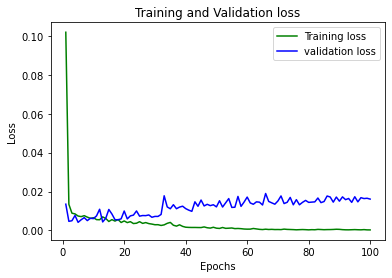

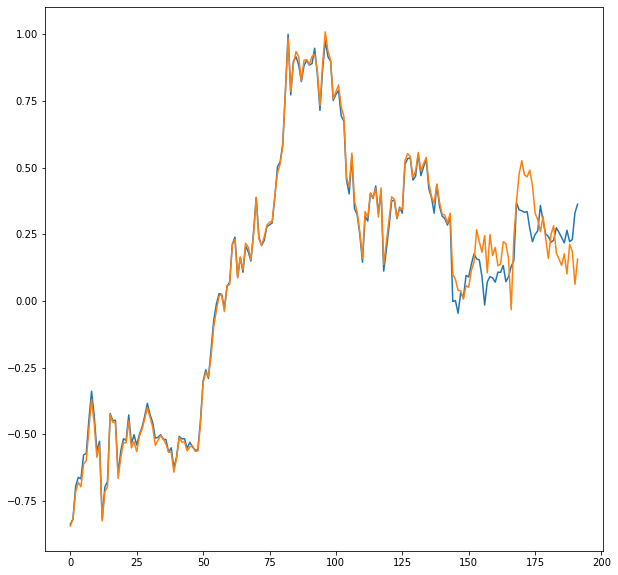

In [16]:
OPTIMIZER = tf.keras.optimizers.Adam(learning_rate=1e-3, epsilon=1e-08)

tf.keras.backend.clear_session()

model = tf.keras.models.Sequential([
    tf.keras.layers.Conv1D(filters=32,
                           kernel_size=1,
                           strides=1,
                           padding="same",
                           activation="tanh",
                           input_shape=(reddit_train_x.shape[1],reddit_train_x.shape[2])),
    tf.keras.layers.MaxPooling1D(pool_size=1, strides=1, padding="same"),
    tf.keras.layers.LSTM(64, return_sequences=True),
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(1)
])

# model = tf.keras.models.Sequential([
#     tf.keras.layers.Conv1D(filters=64,
#                            kernel_size=5,
#                            strides=1,
#                            padding="causal",
#                            activation="tanh",
#                            input_shape=(reddit_train_x.shape[1],reddit_train_x.shape[2])),
#     tf.keras.layers.MaxPooling1D(pool_size=2, strides=1, padding="valid"),
#     tf.keras.layers.Conv1D(filters=32, kernel_size=3, strides=1, padding="causal", activation="relu"),
#     tf.keras.layers.MaxPooling1D(pool_size=2, strides=1, padding="valid"),
#     tf.keras.layers.LSTM(128, return_sequences=True),
#     tf.keras.layers.LSTM(128, return_sequences=True),
#     tf.keras.layers.Flatten(),
#     tf.keras.layers.Dense(64, activation="relu"),
#     tf.keras.layers.Dropout(0.2),
#     tf.keras.layers.Dense(16, activation="relu"),
#     tf.keras.layers.Dropout(0.1),
#     tf.keras.layers.Dense(1)
# ])



model.compile(loss=tf.keras.losses.MeanSquaredError(), optimizer=OPTIMIZER, metrics=['mae'])
# print(model.summary())

BATCH_SIZE=5
TRAIN_STEP = math.ceil(reddit_train_x.shape[0] / BATCH_SIZE)
VALIDATION_STEP = math.ceil(reddit_val_x.shape[0] / BATCH_SIZE)

history = model.fit(train_set,
                    epochs=100,
                    steps_per_epoch=TRAIN_STEP,
                    validation_data=cross_validation_set,
                    validation_steps=VALIDATION_STEP,
                    verbose=0)

from datetime import datetime
# Code to create graph for train vs validation error for different epochs
loss_train = history.history['loss']
loss_val = history.history['val_loss']
diff_in_loss=abs(np.subtract(loss_val,loss_train));
df = pd.DataFrame({'loss_train':loss_train, 'loss_val':loss_val, 'diff_in_loss':diff_in_loss})
print(df.head(10))

epochs = range(1,len(loss_train)+1)
plt.plot(epochs, loss_train, 'g', label='Training loss')
plt.plot(epochs, loss_val, 'b', label='validation loss')
# plt.plot(epochs, diff_in_loss, 'r', label='diff in loss')

plt.title('Training and Validation loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

reddit_pred_train_x = model.predict(unshuffled_train_set, steps=TRAIN_STEP)
reddit_pred_val_x = model.predict(dev_set, steps=VALIDATION_STEP)
reddit_pred_test_x = model.predict(cross_validation_set, steps=VALIDATION_STEP)

predictions = np.concatenate((reddit_pred_train_x[:,0], reddit_pred_val_x[:,0], reddit_pred_test_x[:,0]))
true_vals = np.concatenate((reddit_train_y, reddit_val_y, reddit_test_y))

plt.figure(figsize=(10, 10))
plt.plot(true_vals)
plt.plot(predictions)


def compute_perf_metrics(true_labels, predicted_labels):    
    metrics_result = []
    
    keras_metrics = [
    tf.keras.metrics.MeanAbsoluteError(),
    tf.keras.metrics.RootMeanSquaredError(),
    tf.keras.metrics.MeanAbsolutePercentageError(),
    tf.keras.metrics.MeanSquaredError()
    ]
    
    for metric in keras_metrics:
        metric.reset_states()
        metric.update_state(true_labels, predicted_labels)
        metrics_result.append(metric.result().numpy())  
        
    metrics_result.append(r2_score(true_labels, predicted_labels))
    print(metrics_result)
    return metrics_result


train_metrics = compute_perf_metrics(reddit_train_y, reddit_pred_train_x)
train_metrics.insert(0, 'Train')
val_metrics = compute_perf_metrics(reddit_val_y, reddit_pred_val_x)
val_metrics.insert(0, 'Validation')
dev_metrics = compute_perf_metrics(reddit_test_y, reddit_pred_test_x)
dev_metrics.insert(0, 'Dev')

COL_NAMES = ['','MAE','RMSE','RMSE','MSE','R2']
metrics_table = pd.DataFrame([train_metrics, val_metrics, dev_metrics], columns=COL_NAMES)
metrics_table = metrics_table.set_index([''])
metrics_table.round(3)

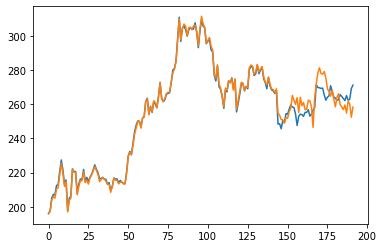

In [17]:
true_val2 = np.c_[np.zeros((true_vals.shape[0],19)), true_vals]
# true_val2 = scaler.inverse_transform(true_val2)
true_df = pd.DataFrame(true_val2, columns=['ACD','MACD','CHO','Highest_T','Lowest_T','S-K','S-D','VPT','W-R','RSI','MOME','AC','PROC','VROC','OBV','positive','neutral','negative','log_ret-t','Close'])
true_df.iloc[:] = scaler.inverse_transform(true_df.iloc[:].values)
# true_df['Close']

pred_val2 = np.c_[np.zeros((predictions.shape[0],19)), predictions]
# true_val2 = scaler.inverse_transform(true_val2)
pred_df = pd.DataFrame(pred_val2, columns=['ACD','MACD','CHO','Highest_T','Lowest_T','S-K','S-D','VPT','W-R','RSI','MOME','AC','PROC','VROC','OBV','positive','neutral','negative','log_ret-t','Close'])
pred_df.iloc[:] = scaler.inverse_transform(pred_df.iloc[:].values)
# pred_df['Close']

plt.plot(true_df['Close'])
plt.plot(pred_df['Close'])

## 4. Hyperparameter tuning
- *Define a parameterized CNN-LSTM model and get the best hyperparameters for each ticker*
- *use gridsearchCV for the tuning operation*
- *provide options as different combinations to reduct cost and time of tuning operation*

In [18]:
results_df = pd.DataFrame(columns = ['param_batch_size', 'param_epochs', 'param_learning_rt',
                                       'param_optimizer_fnc', 'params', 
                                       'mean_test_R2', 'rank_test_R2',
                                       'mean_test_MAE', 'rank_test_MAE',
                                       'mean_test_MSE', 'rank_test_MSE',
                                       'mean_test_RMSE', 'rank_test_RMSE', 'ticker'])

In [19]:
for tick in reddit_data.keys():
    temp_data_df = reddit_data[f'{tick}']
    temp_data_df = temp_data_df.dropna()
    temp_data_df = temp_data_df.reset_index(drop=True)  
    temp_data_df = temp_data_df.applymap(lambda x: float( '%.5f'%(x)))
    print(f"starting to process data for {tick}")
    
    
    reddit_train_x, reddit_train_y, reddit_test_x, reddit_test_y, reddit_val_x, reddit_val_y = data_split_and_sliding_window(temp_data_df,
                                                                                                                         TRAIN_TESTVAL_SPLIT, 
                                                                                                                         TEST_VAL_SPLIT, 
                                                                                                                         N_TIME_STEPS, 
                                                                                                                         STEP)

    print(np.any(np.isnan(reddit_train_x)))
    print(np.all(np.isfinite(reddit_train_x)))
    
    train_set = tf_dataset(reddit_train_x, reddit_train_y, 5, 1000)
    unshuffled_train_set = tf_dataset(reddit_train_x, reddit_train_y, 5, 1000, False)
    cross_validation_set = tf_dataset(reddit_test_x, reddit_test_y, 5, 1000, False)
    dev_set = tf_dataset(reddit_val_x, reddit_val_y, 5, 1000, False)

    print(reddit_train_x.shape, reddit_train_y.shape)
    print(reddit_test_x.shape, reddit_test_y.shape)
    print(reddit_val_x.shape, reddit_val_y.shape)




    def build_model(optimizer_fnc='Adam', learning_rt=0.001, 
                    conv_filters=32, conv_activation='tanh', conv_kernel_size=1,
                    second_conv_layer=False, second_conv_filters=64, second_conv_activation='tanh', second_conv_kernel_size=2,
                    pool_size=2, 
                    lstm_units=64, 
                    second_dense_layer=False, dense_units=32):
        
        
        model = tf.keras.models.Sequential()
        model.add(tf.keras.layers.Conv1D(filters=conv_filters,
                                           kernel_size=conv_kernel_size,
                                           strides=1,
                                           padding="same",
                                           activation=conv_activation,
                                           input_shape=(reddit_train_x.shape[1],reddit_train_x.shape[2]))
                                     )
        if second_conv_layer == True:
            model.add(tf.keras.layers.Conv1D(filters=second_conv_filters,
                                               kernel_size=second_conv_kernel_size,
                                               strides=1,
                                               padding="same",
                                               activation=second_conv_activation,
                                               input_shape=((reddit_train_x.shape[1]-conv_kernel_size)+1,conv_filters))
                                         )
        model.add(tf.keras.layers.MaxPooling1D(pool_size=pool_size, strides=1, padding="same"))
        model.add(tf.keras.layers.LSTM(lstm_units, return_sequences=True))
        model.add(tf.keras.layers.Flatten())
        if second_dense_layer == True:
            model.add(tf.keras.layers.Dense(dense_units))
        model.add(tf.keras.layers.Dense(1))

        OPTIMIZER = tf.keras.optimizers.Adam(learning_rate=learning_rt)
        
        if optimizer_fnc == 'SGD':
            OPTIMIZER = tf.keras.optimizers.SGD(learning_rate=learning_rt)
        elif optimizer_fnc == 'Nadam':
            OPTIMIZER = tf.keras.optimizers.Nadam(learning_rate=learning_rt)
        elif optimizer_fnc == 'RMSprop':
            OPTIMIZER = tf.keras.optimizers.RMSprop(learning_rate=learning_rt)
        elif optimizer_fnc == 'Adadelta':
            OPTIMIZER = tf.keras.optimizers.Adadelta(learning_rate=learning_rt)
        elif optimizer_fnc == 'Adagrad':
            OPTIMIZER = tf.keras.optimizers.Adagrad(learning_rate=learning_rt)
        elif optimizer_fnc == 'Adamax':
            OPTIMIZER = tf.keras.optimizers.Adamax(learning_rate=learning_rt)        

        model.compile(loss=tf.keras.losses.MeanAbsoluteError(), optimizer=OPTIMIZER, metrics=['mae'])
        return model


    # create model
    model = KerasRegressor(build_fn=build_model, verbose=0)
    
    # define the grid search parameters
    param_grid = [
        {
        'batch_size':[5, 10, 16],
        'epochs':[20, 50, 100],
        'conv_filters':[32],
        'conv_activation':['tanh', 'relu'],
        'conv_kernel_size':[1],

        'second_conv_layer':[False],
        'second_conv_filters':[64],
        'second_conv_activation':['tanh'], 
        'second_conv_kernel_size':[1],

        'pool_size':[1],
        'lstm_units':[64, 200],
        'learning_rt':[1e-3, 1e-4, 1e-5],
        'optimizer_fnc':['Adam', 'SGD'],
        'second_dense_layer':[False],
        'dense_units':[32]
        },

        {
        'batch_size':[5, 10, 16],
        'epochs':[20, 50, 100],
        'conv_filters':[64],
        'conv_activation':['tanh'],
        'conv_kernel_size':[2],

        'second_conv_layer':[True],
        'second_conv_filters':[64, 128],
        'second_conv_activation':['tanh'],
        'second_conv_kernel_size':[2],

        'pool_size':[2],
        'lstm_units':[200],
        'learning_rt':[1e-3, 1e-4, 1e-5],
        'optimizer_fnc':['Adam', 'SGD'],
        'second_dense_layer':[True],
        'dense_units':[32, 200]
        }
        ,

        {
        'batch_size':[5, 10, 16],
        'epochs':[20, 50, 100],
        'conv_filters':[64],
        'conv_activation':['relu'],
        'conv_kernel_size':[2],

        'second_conv_layer':[True],
        'second_conv_filters':[64, 128],
        'second_conv_activation':['relu'],
        'second_conv_kernel_size':[1],        


        'pool_size':[2],
        'lstm_units':[200],
        'learning_rt':[1e-3, 1e-4, 1e-5],
        'optimizer_fnc':['Adam', 'SGD'],
        'second_dense_layer':[True],
        'dense_units':[32, 200]
        },
        
        {
        'batch_size':[5, 10, 16],
        'epochs':[20, 50, 100],
        'conv_filters':[64],
        'conv_activation':['tanh'],
        'conv_kernel_size':[3],

        'second_conv_layer':[True],
        'second_conv_filters':[64, 128],
        'second_conv_activation':['tanh'],
        'second_conv_kernel_size':[3],        


        'pool_size':[2],
        'lstm_units':[200],
        'learning_rt':[1e-3, 1e-4, 1e-5],
        'optimizer_fnc':['Adam', 'SGD'],
        'second_dense_layer':[True],
        'dense_units':[200]
        },

        {
        'batch_size':[5, 10, 16],
        'epochs':[20, 50, 100],
        'conv_filters':[64],
        'conv_activation':['relu'],
        'conv_kernel_size':[3],

        'second_conv_layer':[True],
        'second_conv_filters':[64, 128],
        'second_conv_activation':['relu'],
        'second_conv_kernel_size':[3],        


        'pool_size':[2],
        'lstm_units':[200],
        'learning_rt':[1e-3, 1e-4, 1e-5],
        'optimizer_fnc':['Adam', 'SGD'],
        'second_dense_layer':[True],
        'dense_units':[200]
        }        
        
        ]

    
    scoring = {'R2': 'r2', 'MAE': 'neg_mean_absolute_error', 'MSE': 'neg_mean_squared_error', 'RMSE': 'neg_root_mean_squared_error'}#, 'MAPE': 'neg_mean_absolute_percentage_error'}

    grid = GridSearchCV(estimator=model, param_grid=param_grid, n_jobs=None, cv=3, scoring=scoring, refit='R2', verbose=2)
    grid_result = grid.fit(reddit_train_x, reddit_train_y)

    print(f"TICKER: {tick}")
    print("Best R2 score: %f using %s" % (grid_result.best_score_, grid_result.best_params_))
    params = grid_result.cv_results_['params']
    mean_r2 = grid_result.cv_results_['mean_test_R2']
    mean_mae = grid_result.cv_results_['mean_test_MAE']
    mean_mse = grid_result.cv_results_['mean_test_MSE']
    mean_rmse = grid_result.cv_results_['mean_test_RMSE']
    #mean_mape = grid_result.cv_results_['mean_MAPE']
    for r2, mae, mse, rmse, param in zip(mean_r2, mean_mae, mean_mse, mean_rmse, params):
        print("R2:%f, MAE:%f, MSE:%f, RMSE:%f with: %r" % (r2,mae,mse,rmse,param))        

    temp_results = pd.DataFrame(grid_result.cv_results_)[['param_batch_size', 'param_epochs', 'param_learning_rt',
                                           'param_optimizer_fnc', 'params', 
                                           'mean_test_R2', 'rank_test_R2',
                                           'mean_test_MAE', 'rank_test_MAE',
                                           'mean_test_MSE', 'rank_test_MSE',
                                           'mean_test_RMSE', 'rank_test_RMSE']]
    temp_results['ticker'] = f'{tick}'
    temp_results.to_csv(f"C:\\Users\\Karthik\\Desktop\\{tick}_grid_search.csv")
    results_df.append(temp_results, ignore_index = True)    
    
    

starting to process data for AAPL
False
True
(143, 5, 19) (143,)
(24, 5, 19) (24,)
(24, 5, 19) (24,)
Fitting 3 folds for each of 864 candidates, totalling 2592 fits
[CV] batch_size=5, conv_activation=tanh, conv_filters=32, conv_kernel_size=1, dense_units=32, epochs=20, learning_rt=0.001, lstm_units=64, optimizer_fnc=Adam, pool_size=1, second_conv_activation=tanh, second_conv_filters=64, second_conv_kernel_size=1, second_conv_layer=False, second_dense_layer=False 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  batch_size=5, conv_activation=tanh, conv_filters=32, conv_kernel_size=1, dense_units=32, epochs=20, learning_rt=0.001, lstm_units=64, optimizer_fnc=Adam, pool_size=1, second_conv_activation=tanh, second_conv_filters=64, second_conv_kernel_size=1, second_conv_layer=False, second_dense_layer=False, total=   3.3s
[CV] batch_size=5, conv_activation=tanh, conv_filters=32, conv_kernel_size=1, dense_units=32, epochs=20, learning_rt=0.001, lstm_units=64, optimizer_fnc=Adam, pool_size=1, second_conv_activation=tanh, second_conv_filters=64, second_conv_kernel_size=1, second_conv_layer=False, second_dense_layer=False 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    3.2s remaining:    0.0s


[CV]  batch_size=5, conv_activation=tanh, conv_filters=32, conv_kernel_size=1, dense_units=32, epochs=20, learning_rt=0.001, lstm_units=64, optimizer_fnc=Adam, pool_size=1, second_conv_activation=tanh, second_conv_filters=64, second_conv_kernel_size=1, second_conv_layer=False, second_dense_layer=False, total=   3.0s
[CV] batch_size=5, conv_activation=tanh, conv_filters=32, conv_kernel_size=1, dense_units=32, epochs=20, learning_rt=0.001, lstm_units=64, optimizer_fnc=Adam, pool_size=1, second_conv_activation=tanh, second_conv_filters=64, second_conv_kernel_size=1, second_conv_layer=False, second_dense_layer=False 
[CV]  batch_size=5, conv_activation=tanh, conv_filters=32, conv_kernel_size=1, dense_units=32, epochs=20, learning_rt=0.001, lstm_units=64, optimizer_fnc=Adam, pool_size=1, second_conv_activation=tanh, second_conv_filters=64, second_conv_kernel_size=1, second_conv_layer=False, second_dense_layer=False, total=   3.5s
[CV] batch_size=5, conv_activation=tanh, conv_filters=32, con

[Parallel(n_jobs=1)]: Done 2592 out of 2592 | elapsed: 189.1min finished


TICKER: AAPL
Best R2 score: 0.481181 using {'batch_size': 5, 'conv_activation': 'tanh', 'conv_filters': 64, 'conv_kernel_size': 2, 'dense_units': 32, 'epochs': 100, 'learning_rt': 0.001, 'lstm_units': 200, 'optimizer_fnc': 'SGD', 'pool_size': 2, 'second_conv_activation': 'tanh', 'second_conv_filters': 128, 'second_conv_kernel_size': 2, 'second_conv_layer': True, 'second_dense_layer': True}
R2:-0.168911, MAE:-0.230920, MSE:-0.079959, RMSE:-0.277017 with: {'batch_size': 5, 'conv_activation': 'tanh', 'conv_filters': 32, 'conv_kernel_size': 1, 'dense_units': 32, 'epochs': 20, 'learning_rt': 0.001, 'lstm_units': 64, 'optimizer_fnc': 'Adam', 'pool_size': 1, 'second_conv_activation': 'tanh', 'second_conv_filters': 64, 'second_conv_kernel_size': 1, 'second_conv_layer': False, 'second_dense_layer': False}
R2:-1.601211, MAE:-0.353991, MSE:-0.174133, RMSE:-0.395699 with: {'batch_size': 5, 'conv_activation': 'tanh', 'conv_filters': 32, 'conv_kernel_size': 1, 'dense_units': 32, 'epochs': 20, 'learn

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  batch_size=5, conv_activation=tanh, conv_filters=32, conv_kernel_size=1, dense_units=32, epochs=20, learning_rt=0.001, lstm_units=64, optimizer_fnc=Adam, pool_size=1, second_conv_activation=tanh, second_conv_filters=64, second_conv_kernel_size=1, second_conv_layer=False, second_dense_layer=False, total=   2.6s
[CV] batch_size=5, conv_activation=tanh, conv_filters=32, conv_kernel_size=1, dense_units=32, epochs=20, learning_rt=0.001, lstm_units=64, optimizer_fnc=Adam, pool_size=1, second_conv_activation=tanh, second_conv_filters=64, second_conv_kernel_size=1, second_conv_layer=False, second_dense_layer=False 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    2.5s remaining:    0.0s


[CV]  batch_size=5, conv_activation=tanh, conv_filters=32, conv_kernel_size=1, dense_units=32, epochs=20, learning_rt=0.001, lstm_units=64, optimizer_fnc=Adam, pool_size=1, second_conv_activation=tanh, second_conv_filters=64, second_conv_kernel_size=1, second_conv_layer=False, second_dense_layer=False, total=   2.6s
[CV] batch_size=5, conv_activation=tanh, conv_filters=32, conv_kernel_size=1, dense_units=32, epochs=20, learning_rt=0.001, lstm_units=64, optimizer_fnc=Adam, pool_size=1, second_conv_activation=tanh, second_conv_filters=64, second_conv_kernel_size=1, second_conv_layer=False, second_dense_layer=False 
[CV]  batch_size=5, conv_activation=tanh, conv_filters=32, conv_kernel_size=1, dense_units=32, epochs=20, learning_rt=0.001, lstm_units=64, optimizer_fnc=Adam, pool_size=1, second_conv_activation=tanh, second_conv_filters=64, second_conv_kernel_size=1, second_conv_layer=False, second_dense_layer=False, total=   2.5s
[CV] batch_size=5, conv_activation=tanh, conv_filters=32, con

[Parallel(n_jobs=1)]: Done 2592 out of 2592 | elapsed: 155.2min finished


TICKER: AMC
Best R2 score: 0.232339 using {'batch_size': 16, 'conv_activation': 'relu', 'conv_filters': 64, 'conv_kernel_size': 2, 'dense_units': 32, 'epochs': 50, 'learning_rt': 1e-05, 'lstm_units': 200, 'optimizer_fnc': 'Adam', 'pool_size': 2, 'second_conv_activation': 'relu', 'second_conv_filters': 128, 'second_conv_kernel_size': 1, 'second_conv_layer': True, 'second_dense_layer': True}
R2:-1.400406, MAE:-0.083329, MSE:-0.013219, RMSE:-0.105695 with: {'batch_size': 5, 'conv_activation': 'tanh', 'conv_filters': 32, 'conv_kernel_size': 1, 'dense_units': 32, 'epochs': 20, 'learning_rt': 0.001, 'lstm_units': 64, 'optimizer_fnc': 'Adam', 'pool_size': 1, 'second_conv_activation': 'tanh', 'second_conv_filters': 64, 'second_conv_kernel_size': 1, 'second_conv_layer': False, 'second_dense_layer': False}
R2:-6.195323, MAE:-0.117139, MSE:-0.018419, RMSE:-0.133967 with: {'batch_size': 5, 'conv_activation': 'tanh', 'conv_filters': 32, 'conv_kernel_size': 1, 'dense_units': 32, 'epochs': 20, 'learn

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  batch_size=5, conv_activation=tanh, conv_filters=32, conv_kernel_size=1, dense_units=32, epochs=20, learning_rt=0.001, lstm_units=64, optimizer_fnc=Adam, pool_size=1, second_conv_activation=tanh, second_conv_filters=64, second_conv_kernel_size=1, second_conv_layer=False, second_dense_layer=False, total=   3.2s
[CV] batch_size=5, conv_activation=tanh, conv_filters=32, conv_kernel_size=1, dense_units=32, epochs=20, learning_rt=0.001, lstm_units=64, optimizer_fnc=Adam, pool_size=1, second_conv_activation=tanh, second_conv_filters=64, second_conv_kernel_size=1, second_conv_layer=False, second_dense_layer=False 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    3.1s remaining:    0.0s


[CV]  batch_size=5, conv_activation=tanh, conv_filters=32, conv_kernel_size=1, dense_units=32, epochs=20, learning_rt=0.001, lstm_units=64, optimizer_fnc=Adam, pool_size=1, second_conv_activation=tanh, second_conv_filters=64, second_conv_kernel_size=1, second_conv_layer=False, second_dense_layer=False, total=   3.0s
[CV] batch_size=5, conv_activation=tanh, conv_filters=32, conv_kernel_size=1, dense_units=32, epochs=20, learning_rt=0.001, lstm_units=64, optimizer_fnc=Adam, pool_size=1, second_conv_activation=tanh, second_conv_filters=64, second_conv_kernel_size=1, second_conv_layer=False, second_dense_layer=False 
[CV]  batch_size=5, conv_activation=tanh, conv_filters=32, conv_kernel_size=1, dense_units=32, epochs=20, learning_rt=0.001, lstm_units=64, optimizer_fnc=Adam, pool_size=1, second_conv_activation=tanh, second_conv_filters=64, second_conv_kernel_size=1, second_conv_layer=False, second_dense_layer=False, total=   3.3s
[CV] batch_size=5, conv_activation=tanh, conv_filters=32, con

[Parallel(n_jobs=1)]: Done 2592 out of 2592 | elapsed: 186.8min finished


TICKER: DKNG
Best R2 score: 0.632300 using {'batch_size': 5, 'conv_activation': 'tanh', 'conv_filters': 64, 'conv_kernel_size': 2, 'dense_units': 200, 'epochs': 100, 'learning_rt': 0.001, 'lstm_units': 200, 'optimizer_fnc': 'SGD', 'pool_size': 2, 'second_conv_activation': 'tanh', 'second_conv_filters': 128, 'second_conv_kernel_size': 2, 'second_conv_layer': True, 'second_dense_layer': True}
R2:0.059530, MAE:-0.248646, MSE:-0.091045, RMSE:-0.293385 with: {'batch_size': 5, 'conv_activation': 'tanh', 'conv_filters': 32, 'conv_kernel_size': 1, 'dense_units': 32, 'epochs': 20, 'learning_rt': 0.001, 'lstm_units': 64, 'optimizer_fnc': 'Adam', 'pool_size': 1, 'second_conv_activation': 'tanh', 'second_conv_filters': 64, 'second_conv_kernel_size': 1, 'second_conv_layer': False, 'second_dense_layer': False}
R2:-0.624240, MAE:-0.356238, MSE:-0.181146, RMSE:-0.394207 with: {'batch_size': 5, 'conv_activation': 'tanh', 'conv_filters': 32, 'conv_kernel_size': 1, 'dense_units': 32, 'epochs': 20, 'learn

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  batch_size=5, conv_activation=tanh, conv_filters=32, conv_kernel_size=1, dense_units=32, epochs=20, learning_rt=0.001, lstm_units=64, optimizer_fnc=Adam, pool_size=1, second_conv_activation=tanh, second_conv_filters=64, second_conv_kernel_size=1, second_conv_layer=False, second_dense_layer=False, total=   3.4s
[CV] batch_size=5, conv_activation=tanh, conv_filters=32, conv_kernel_size=1, dense_units=32, epochs=20, learning_rt=0.001, lstm_units=64, optimizer_fnc=Adam, pool_size=1, second_conv_activation=tanh, second_conv_filters=64, second_conv_kernel_size=1, second_conv_layer=False, second_dense_layer=False 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    3.3s remaining:    0.0s


[CV]  batch_size=5, conv_activation=tanh, conv_filters=32, conv_kernel_size=1, dense_units=32, epochs=20, learning_rt=0.001, lstm_units=64, optimizer_fnc=Adam, pool_size=1, second_conv_activation=tanh, second_conv_filters=64, second_conv_kernel_size=1, second_conv_layer=False, second_dense_layer=False, total=   3.4s
[CV] batch_size=5, conv_activation=tanh, conv_filters=32, conv_kernel_size=1, dense_units=32, epochs=20, learning_rt=0.001, lstm_units=64, optimizer_fnc=Adam, pool_size=1, second_conv_activation=tanh, second_conv_filters=64, second_conv_kernel_size=1, second_conv_layer=False, second_dense_layer=False 
[CV]  batch_size=5, conv_activation=tanh, conv_filters=32, conv_kernel_size=1, dense_units=32, epochs=20, learning_rt=0.001, lstm_units=64, optimizer_fnc=Adam, pool_size=1, second_conv_activation=tanh, second_conv_filters=64, second_conv_kernel_size=1, second_conv_layer=False, second_dense_layer=False, total=   3.4s
[CV] batch_size=5, conv_activation=tanh, conv_filters=32, con

[Parallel(n_jobs=1)]: Done 2592 out of 2592 | elapsed: 190.6min finished


TICKER: TSLA
Best R2 score: 0.373198 using {'batch_size': 10, 'conv_activation': 'tanh', 'conv_filters': 64, 'conv_kernel_size': 2, 'dense_units': 200, 'epochs': 100, 'learning_rt': 0.001, 'lstm_units': 200, 'optimizer_fnc': 'SGD', 'pool_size': 2, 'second_conv_activation': 'tanh', 'second_conv_filters': 128, 'second_conv_kernel_size': 2, 'second_conv_layer': True, 'second_dense_layer': True}
R2:-1.260225, MAE:-0.186119, MSE:-0.045410, RMSE:-0.209109 with: {'batch_size': 5, 'conv_activation': 'tanh', 'conv_filters': 32, 'conv_kernel_size': 1, 'dense_units': 32, 'epochs': 20, 'learning_rt': 0.001, 'lstm_units': 64, 'optimizer_fnc': 'Adam', 'pool_size': 1, 'second_conv_activation': 'tanh', 'second_conv_filters': 64, 'second_conv_kernel_size': 1, 'second_conv_layer': False, 'second_dense_layer': False}
R2:-11.464047, MAE:-0.408425, MSE:-0.207936, RMSE:-0.438446 with: {'batch_size': 5, 'conv_activation': 'tanh', 'conv_filters': 32, 'conv_kernel_size': 1, 'dense_units': 32, 'epochs': 20, 'le

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  batch_size=5, conv_activation=tanh, conv_filters=32, conv_kernel_size=1, dense_units=32, epochs=20, learning_rt=0.001, lstm_units=64, optimizer_fnc=Adam, pool_size=1, second_conv_activation=tanh, second_conv_filters=64, second_conv_kernel_size=1, second_conv_layer=False, second_dense_layer=False, total=   2.9s
[CV] batch_size=5, conv_activation=tanh, conv_filters=32, conv_kernel_size=1, dense_units=32, epochs=20, learning_rt=0.001, lstm_units=64, optimizer_fnc=Adam, pool_size=1, second_conv_activation=tanh, second_conv_filters=64, second_conv_kernel_size=1, second_conv_layer=False, second_dense_layer=False 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    2.8s remaining:    0.0s


[CV]  batch_size=5, conv_activation=tanh, conv_filters=32, conv_kernel_size=1, dense_units=32, epochs=20, learning_rt=0.001, lstm_units=64, optimizer_fnc=Adam, pool_size=1, second_conv_activation=tanh, second_conv_filters=64, second_conv_kernel_size=1, second_conv_layer=False, second_dense_layer=False, total=   2.6s
[CV] batch_size=5, conv_activation=tanh, conv_filters=32, conv_kernel_size=1, dense_units=32, epochs=20, learning_rt=0.001, lstm_units=64, optimizer_fnc=Adam, pool_size=1, second_conv_activation=tanh, second_conv_filters=64, second_conv_kernel_size=1, second_conv_layer=False, second_dense_layer=False 
[CV]  batch_size=5, conv_activation=tanh, conv_filters=32, conv_kernel_size=1, dense_units=32, epochs=20, learning_rt=0.001, lstm_units=64, optimizer_fnc=Adam, pool_size=1, second_conv_activation=tanh, second_conv_filters=64, second_conv_kernel_size=1, second_conv_layer=False, second_dense_layer=False, total=   3.4s
[CV] batch_size=5, conv_activation=tanh, conv_filters=32, con

[Parallel(n_jobs=1)]: Done 2592 out of 2592 | elapsed: 190.6min finished


TICKER: AMD
Best R2 score: -0.232138 using {'batch_size': 5, 'conv_activation': 'tanh', 'conv_filters': 64, 'conv_kernel_size': 2, 'dense_units': 32, 'epochs': 100, 'learning_rt': 1e-05, 'lstm_units': 200, 'optimizer_fnc': 'Adam', 'pool_size': 2, 'second_conv_activation': 'tanh', 'second_conv_filters': 128, 'second_conv_kernel_size': 2, 'second_conv_layer': True, 'second_dense_layer': True}
R2:-1.129165, MAE:-0.278002, MSE:-0.113018, RMSE:-0.332812 with: {'batch_size': 5, 'conv_activation': 'tanh', 'conv_filters': 32, 'conv_kernel_size': 1, 'dense_units': 32, 'epochs': 20, 'learning_rt': 0.001, 'lstm_units': 64, 'optimizer_fnc': 'Adam', 'pool_size': 1, 'second_conv_activation': 'tanh', 'second_conv_filters': 64, 'second_conv_kernel_size': 1, 'second_conv_layer': False, 'second_dense_layer': False}
R2:-2.572664, MAE:-0.374261, MSE:-0.188877, RMSE:-0.419028 with: {'batch_size': 5, 'conv_activation': 'tanh', 'conv_filters': 32, 'conv_kernel_size': 1, 'dense_units': 32, 'epochs': 20, 'lear

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  batch_size=5, conv_activation=tanh, conv_filters=32, conv_kernel_size=1, dense_units=32, epochs=20, learning_rt=0.001, lstm_units=64, optimizer_fnc=Adam, pool_size=1, second_conv_activation=tanh, second_conv_filters=64, second_conv_kernel_size=1, second_conv_layer=False, second_dense_layer=False, total=   3.3s
[CV] batch_size=5, conv_activation=tanh, conv_filters=32, conv_kernel_size=1, dense_units=32, epochs=20, learning_rt=0.001, lstm_units=64, optimizer_fnc=Adam, pool_size=1, second_conv_activation=tanh, second_conv_filters=64, second_conv_kernel_size=1, second_conv_layer=False, second_dense_layer=False 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    3.2s remaining:    0.0s


[CV]  batch_size=5, conv_activation=tanh, conv_filters=32, conv_kernel_size=1, dense_units=32, epochs=20, learning_rt=0.001, lstm_units=64, optimizer_fnc=Adam, pool_size=1, second_conv_activation=tanh, second_conv_filters=64, second_conv_kernel_size=1, second_conv_layer=False, second_dense_layer=False, total=   3.4s
[CV] batch_size=5, conv_activation=tanh, conv_filters=32, conv_kernel_size=1, dense_units=32, epochs=20, learning_rt=0.001, lstm_units=64, optimizer_fnc=Adam, pool_size=1, second_conv_activation=tanh, second_conv_filters=64, second_conv_kernel_size=1, second_conv_layer=False, second_dense_layer=False 
[CV]  batch_size=5, conv_activation=tanh, conv_filters=32, conv_kernel_size=1, dense_units=32, epochs=20, learning_rt=0.001, lstm_units=64, optimizer_fnc=Adam, pool_size=1, second_conv_activation=tanh, second_conv_filters=64, second_conv_kernel_size=1, second_conv_layer=False, second_dense_layer=False, total=   3.2s
[CV] batch_size=5, conv_activation=tanh, conv_filters=32, con

[Parallel(n_jobs=1)]: Done 2592 out of 2592 | elapsed: 192.3min finished


TICKER: BABA
Best R2 score: 0.449395 using {'batch_size': 10, 'conv_activation': 'tanh', 'conv_filters': 64, 'conv_kernel_size': 2, 'dense_units': 200, 'epochs': 100, 'learning_rt': 1e-05, 'lstm_units': 200, 'optimizer_fnc': 'Adam', 'pool_size': 2, 'second_conv_activation': 'tanh', 'second_conv_filters': 128, 'second_conv_kernel_size': 2, 'second_conv_layer': True, 'second_dense_layer': True}
R2:0.061416, MAE:-0.215123, MSE:-0.062149, RMSE:-0.247983 with: {'batch_size': 5, 'conv_activation': 'tanh', 'conv_filters': 32, 'conv_kernel_size': 1, 'dense_units': 32, 'epochs': 20, 'learning_rt': 0.001, 'lstm_units': 64, 'optimizer_fnc': 'Adam', 'pool_size': 1, 'second_conv_activation': 'tanh', 'second_conv_filters': 64, 'second_conv_kernel_size': 1, 'second_conv_layer': False, 'second_dense_layer': False}
R2:-1.686860, MAE:-0.354533, MSE:-0.170087, RMSE:-0.389141 with: {'batch_size': 5, 'conv_activation': 'tanh', 'conv_filters': 32, 'conv_kernel_size': 1, 'dense_units': 32, 'epochs': 20, 'lea

In [60]:
path = r'C:\\Users\\Karthik\\Desktop\\Dissertation\\Hyperparameter tuning\\'
files = os.listdir(path)
results_df = pd.concat([pd.read_csv(f'{path}{f}') for f in files], axis=0)

In [61]:
results_df = results_df[results_df.rank_test_R2==1]
results_df = results_df[['ticker', 'params']]
results_df['params_dict'] = results_df.params.apply(lambda x: ast.literal_eval(x))
results_df = pd.concat([results_df, results_df["params_dict"].apply(pd.Series)], axis=1)
results_df = results_df[['ticker','batch_size','epochs','optimizer_fnc','learning_rt',
                        'conv_activation','conv_filters', 'conv_kernel_size','second_conv_layer','second_conv_activation', 'second_conv_filters','second_conv_kernel_size',
                        'pool_size',
                        'lstm_units',
                        'second_dense_layer',
                        'dense_units']]

results_df.reset_index(drop=True, inplace=True)
results_df

,ticker,batch_size,epochs,optimizer_fnc,learning_rt,conv_activation,conv_filters,conv_kernel_size,second_conv_layer,second_conv_activation,second_conv_filters,second_conv_kernel_size,pool_size,lstm_units,second_dense_layer,dense_units
0,AAPL,5,100,SGD,0.00100,tanh,64,2,True,tanh,128,2,2,200,True,32
1,AMC,16,50,Adam,0.00001,relu,64,2,True,relu,128,1,2,200,True,32
2,AMD,5,100,Adam,0.00001,tanh,64,2,True,tanh,128,2,2,200,True,32
3,BABA,10,100,Adam,0.00001,tanh,64,2,True,tanh,128,2,2,200,True,200
4,DKNG,5,100,SGD,0.00100,tanh,64,2,True,tanh,128,2,2,200,True,200
5,TSLA,10,100,SGD,0.00100,tanh,64,2,True,tanh,128,2,2,200,True,200


## 5. Save the results

In [62]:
results_df.to_pickle(r'C:\\Users\\Karthik\\Desktop\\Dissertation\\Hyperparameter tuning\\Tuning_results.pkl')